# A Diffusion Model from Scratch in Pytorch


**Sources:**
- Github implementation [Denoising Diffusion Pytorch](https://github.com/lucidrains/denoising-diffusion-pytorch)
- Niels Rogge, Kashif Rasul, [Huggingface notebook](https://colab.research.google.com/github/huggingface/notebooks/blob/main/examples/annotated_diffusion.ipynb#scrollTo=3a159023)
- Papers on Diffusion models ([Dhariwal, Nichol, 2021], [Ho et al., 2020] ect.)


## Investigating the dataset

As dataset we use the StandordCars Dataset, which consists of around 8000 images in the train set. Let's see if this is enough to get good results ;-)

In [1]:
import sys
import logging
import torch.nn.functional as F
import torch
import torchvision
import matplotlib.pyplot as plt
from tqdm import tqdm
from torch import nn
import math
from torch.optim import Adam

from torchvision import transforms 
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import numpy as np

# define GPU
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

# Save log
so = open("data.log", 'w', 10)
sys.stdout.echo = so
sys.stderr.echo = so
get_ipython().log.handlers[0].stream = so
get_ipython().log.setLevel(logging.INFO)

# Building the Diffusion Model


## Step 1: The forward process = Noise scheduler




We first need to build the inputs for our model, which are more and more noisy images. Instead of doing this sequentially, we can use the closed form provided in the papers to calculate the image for any of the timesteps individually. 

**Key Takeaways**:
- The noise-levels/variances can be pre-computed
- There are different types of variance schedules
- We can sample each timestep image independently (Sums of Gaussians is also Gaussian)
- No model is needed in this forward step

In [115]:
#### Functions for FW


def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """ 
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)


def forward_diffusion_sample(x_0, t, device="cpu"):
    """ 
    Takes an image and a timestep as input and 
    Return final noised image + final noise after t steps
    """
    
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
#     print("TEST: ", sqrt_alphas_cumprod_t)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    # x_t = sqrt(sqrt_alphas_cumprod_t) * x_0 + sqrt_one_minus_alphas_cumprod_t * noise
    
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)
# Define beta schedule
T = 100
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)
#############

### Utility functions
# Load the data using the ImageFolder dataset
def load_dataset(data_dir):
#     data_dir = "/home/mark/Mark/DIFFUSION"
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1] 
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1] 
    ]
    data_transform = transforms.Compose(data_transforms)

    train_dataset = torchvision.datasets.ImageFolder(os.path.join(data_dir, 'data_ver2'), transform=data_transform)
    test_dataset = torchvision.datasets.ImageFolder(os.path.join(data_dir, 'data_ver2'), transform=data_transform)

    return torch.utils.data.ConcatDataset([train_dataset, test_dataset])

def load_transformed_dataset():
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1] 
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1] 
    ]
    data_transform = transforms.Compose(data_transforms)

    train = torchvision.datasets.StanfordCars(root=".", download=True, 
                                         transform=data_transform)

    test = torchvision.datasets.StanfordCars(root=".", download=True, 
                                         transform=data_transform, split='test')
    return torch.utils.data.ConcatDataset([train, test])


def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :] 
    plt.imshow(reverse_transforms(image))
    plt.savefig("Output/no_label_output.svg")


## Load dataset

In [82]:
data_dir = os.path.join(os.getcwd(),"MRI_backup")
IMG_SIZE = 32
BATCH_SIZE = 16

In [46]:
data_dir

'/home/mark/Mark/DF/MRI_backup'

In [47]:
os.path.join(data_dir,'data_ver2')

'/home/mark/Mark/DF/MRI_backup/data_ver2'

In [48]:
# data = load_transformed_dataset()
data = load_dataset(data_dir)
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

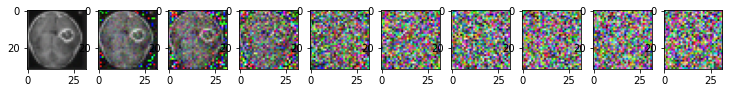

In [108]:
image = next(iter(dataloader))[0]

plt.figure(figsize=(15,15))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

# Forward Diffusion Process after T steps
for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
#     print("Timesteps: ", t)
    plt.subplot(1, num_images+2, (int)(idx/stepsize)+1)
    image, noise = forward_diffusion_sample(image, t)
    
    show_tensor_image(image)

## Step 2: The backward process = U-Net



For a great introduction to UNets, have a look at this post: https://amaarora.github.io/2020/09/13/unet.html.


**Key Takeaways**:
- We use a simple form of a UNet for to predict the noise in the image
- The input is a noisy image, the ouput the noise in the image
- Because the parameters are shared accross time, we need to tell the network in which timestep we are
- The Timestep is encoded by the transformer Sinusoidal Embedding
- We output one single value (mean), because the variance is fixed


In [110]:
# Residual Blocks in Resnet
class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()
        
    def forward(self, x, t, ):
        # First Conv
        h = self.bnorm1(self.relu(self.conv1(x)))
        # Time embedding
        time_emb = self.relu(self.time_mlp(t))
        # Extend last 2 dimensions
        time_emb = time_emb[(..., ) + (None, ) * 2]
        # Add time channel
        h = h + time_emb
        # Second Conv
        h = self.bnorm2(self.relu(self.conv2(h)))
        # Down or Upsample
        return self.transform(h)


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        # TODO: Double check the ordering here
        return embeddings


class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 1 
        time_emb_dim = 32

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )
        
        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        # Upsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])

        self.output = nn.Conv2d(up_channels[-1], 3, out_dim)

    def forward(self, x, timestep):
        # Embedd time
        t = self.time_mlp(timestep)
        # Initial conv
        x = self.conv0(x)
        # Unet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Add residual x as additional channels
            x = torch.cat((x, residual_x), dim=1)           
            x = up(x, t)
        return self.output(x)

model = SimpleUnet()
print("Num params: ", sum(p.numel() for p in model.parameters()))
model

Num params:  62438883


SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transfor


**Further improvements that can be implemented:**
- Residual connections
- Different activation functions like SiLU, GWLU, ...
- BatchNormalization 
- GroupNormalization
- Attention
- ...

## Step 3: The loss



**Key Takeaways:**
- After some maths we end up with a very simple loss function
- There are other possible choices like L2 loss ect.


In [85]:
def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred)

## Sampling
- Without adding @torch.no_grad() we quickly run out of memory, because pytorch tacks all the previous images for gradient calculation 
- Because we pre-calculated the noise variances for the forward pass, we also have to use them when we sequentially perform the backward process

In [111]:
@torch.no_grad()
def sample_timestep(x, t):
    """
    Calls the model to predict the noise in the image and returns 
    the denoised image. 
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
    
    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)
    
    if t == 0:
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise 

@torch.no_grad()
def sample_plot_image():
    # Sample noise
    img_size = IMG_SIZE
    # (1,3,img_size,img_size) -> 1: # of image, 3: # channels (RGB), img_size : W, and H
    img = torch.randn((1, 3, img_size, img_size), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        # print(T)
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()            

## Training and Sampling

  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 0.813816487789154 


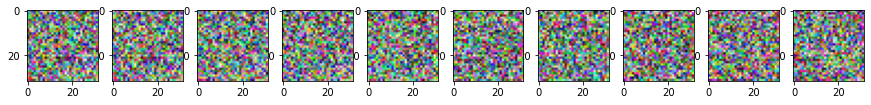

  1%|          | 5/500 [00:27<43:48,  5.31s/it]

Epoch 5 | step 000 Loss: 0.2047239989042282 


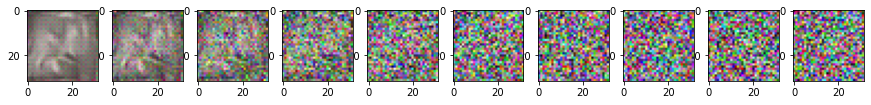

  2%|▏         | 10/500 [00:53<43:16,  5.30s/it]

Epoch 10 | step 000 Loss: 0.16238811612129211 


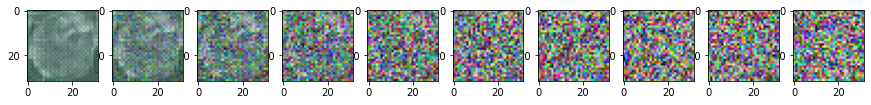

  3%|▎         | 15/500 [01:21<43:02,  5.33s/it]

Epoch 15 | step 000 Loss: 0.2283473014831543 


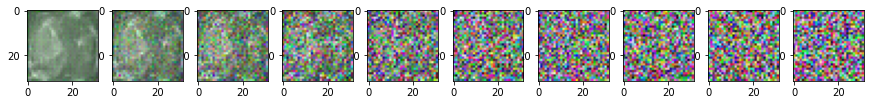

  4%|▍         | 20/500 [01:48<42:24,  5.30s/it]

Epoch 20 | step 000 Loss: 0.16653722524642944 


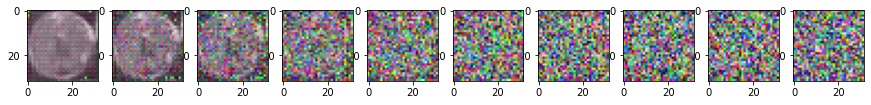

  5%|▌         | 25/500 [02:15<42:00,  5.31s/it]

Epoch 25 | step 000 Loss: 0.17660944163799286 


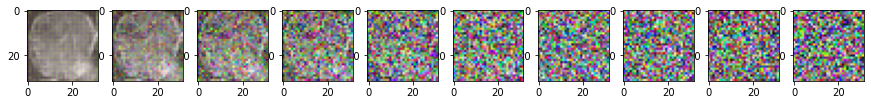

  6%|▌         | 30/500 [02:42<41:37,  5.31s/it]

Epoch 30 | step 000 Loss: 0.16058872640132904 


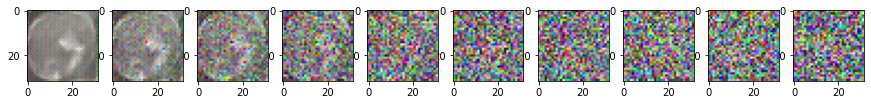

  7%|▋         | 35/500 [03:09<41:07,  5.31s/it]

Epoch 35 | step 000 Loss: 0.18154388666152954 


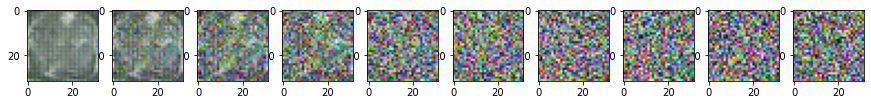

  8%|▊         | 40/500 [03:36<40:55,  5.34s/it]

Epoch 40 | step 000 Loss: 0.16235464811325073 


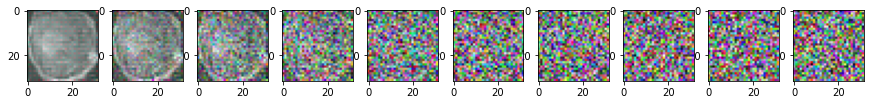

  9%|▉         | 45/500 [04:03<40:14,  5.31s/it]

Epoch 45 | step 000 Loss: 0.18092839419841766 


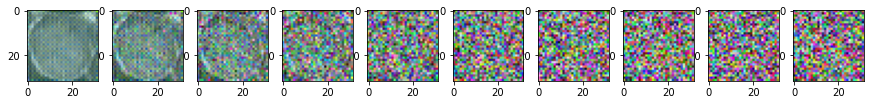

 10%|█         | 50/500 [04:30<39:35,  5.28s/it]

Epoch 50 | step 000 Loss: 0.12537071108818054 


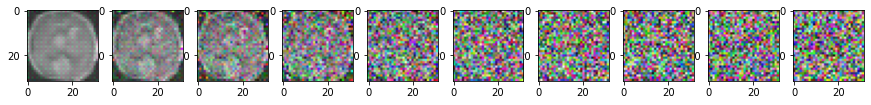

 11%|█         | 55/500 [04:56<39:00,  5.26s/it]

Epoch 55 | step 000 Loss: 0.15239013731479645 


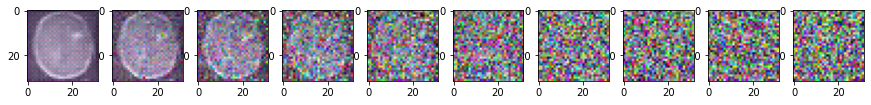

 12%|█▏        | 60/500 [05:23<38:25,  5.24s/it]

Epoch 60 | step 000 Loss: 0.14107578992843628 


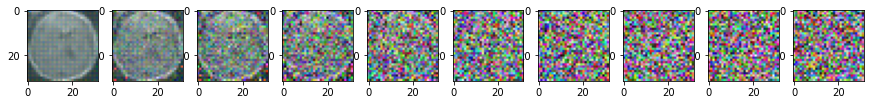

 13%|█▎        | 65/500 [05:50<38:17,  5.28s/it]

Epoch 65 | step 000 Loss: 0.11444016546010971 


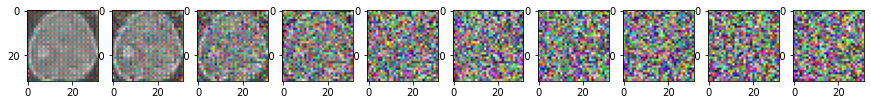

 14%|█▍        | 70/500 [06:17<38:07,  5.32s/it]

Epoch 70 | step 000 Loss: 0.12043412774801254 


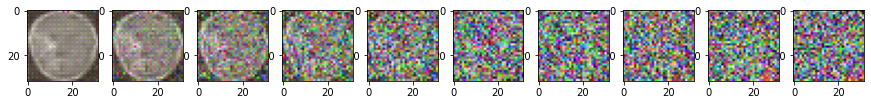

 15%|█▌        | 75/500 [06:46<40:04,  5.66s/it]

Epoch 75 | step 000 Loss: 0.11818816512823105 


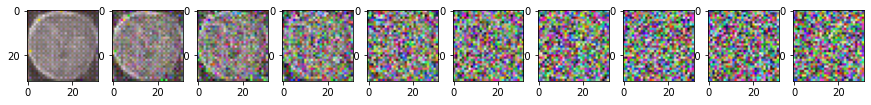

 16%|█▌        | 80/500 [07:16<40:34,  5.80s/it]

Epoch 80 | step 000 Loss: 0.12794363498687744 


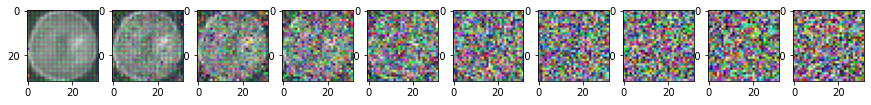

 17%|█▋        | 85/500 [07:45<39:39,  5.73s/it]

Epoch 85 | step 000 Loss: 0.11915208399295807 


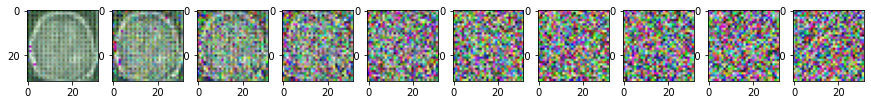

 18%|█▊        | 90/500 [08:14<39:11,  5.74s/it]

Epoch 90 | step 000 Loss: 0.10955812782049179 


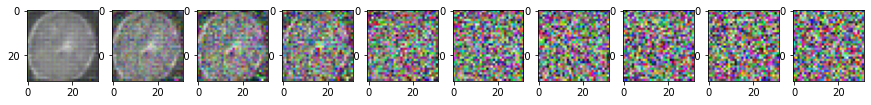

 19%|█▉        | 95/500 [08:43<38:43,  5.74s/it]

Epoch 95 | step 000 Loss: 0.11611466109752655 


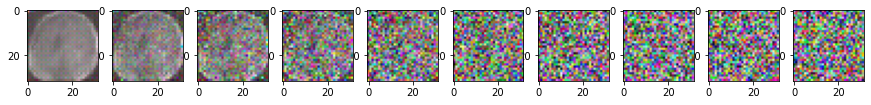

 20%|██        | 100/500 [09:12<38:20,  5.75s/it]

Epoch 100 | step 000 Loss: 0.18940433859825134 


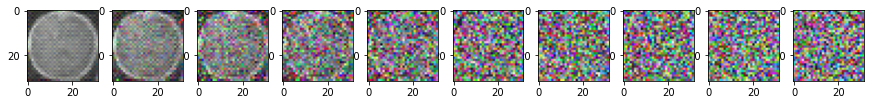

 21%|██        | 105/500 [09:40<34:48,  5.29s/it]

Epoch 105 | step 000 Loss: 0.1317819207906723 


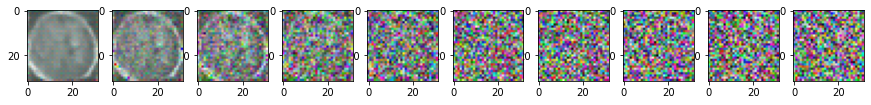

 22%|██▏       | 110/500 [10:07<34:23,  5.29s/it]

Epoch 110 | step 000 Loss: 0.15290197730064392 


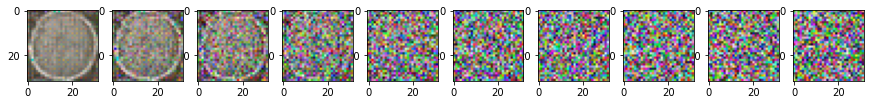

 23%|██▎       | 115/500 [10:33<33:48,  5.27s/it]

Epoch 115 | step 000 Loss: 0.12251969426870346 


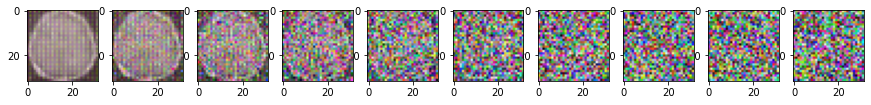

 24%|██▍       | 120/500 [11:00<33:18,  5.26s/it]

Epoch 120 | step 000 Loss: 0.11187715828418732 


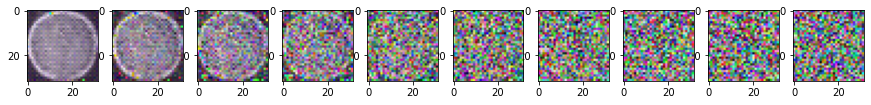

 25%|██▌       | 125/500 [11:27<32:47,  5.25s/it]

Epoch 125 | step 000 Loss: 0.1074766144156456 


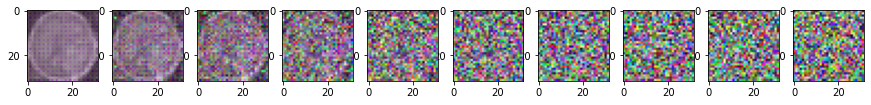

 26%|██▌       | 130/500 [11:54<32:24,  5.26s/it]

Epoch 130 | step 000 Loss: 0.1044652983546257 


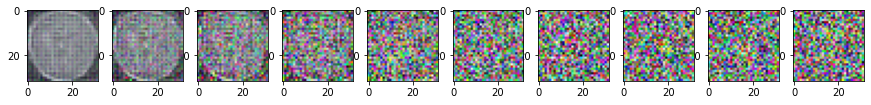

 27%|██▋       | 135/500 [12:22<33:41,  5.54s/it]

Epoch 135 | step 000 Loss: 0.15038207173347473 


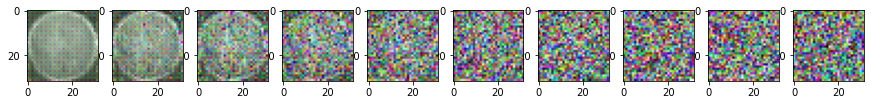

 28%|██▊       | 140/500 [12:51<34:20,  5.72s/it]

Epoch 140 | step 000 Loss: 0.17714247107505798 


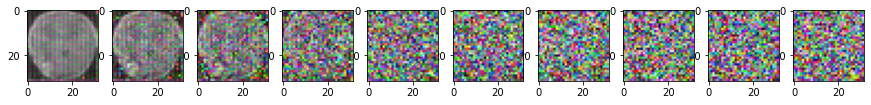

 29%|██▉       | 145/500 [13:20<34:03,  5.76s/it]

Epoch 145 | step 000 Loss: 0.12453409284353256 


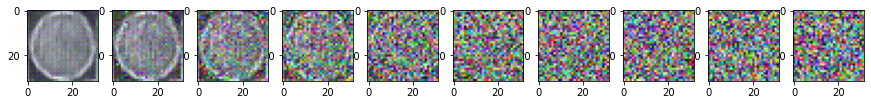

 30%|███       | 150/500 [13:49<33:16,  5.71s/it]

Epoch 150 | step 000 Loss: 0.10373318195343018 


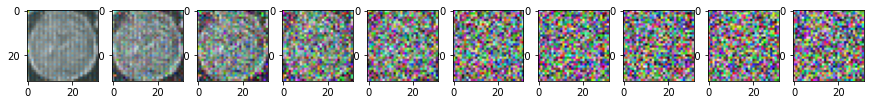

 31%|███       | 155/500 [14:18<33:01,  5.74s/it]

Epoch 155 | step 000 Loss: 0.15747928619384766 


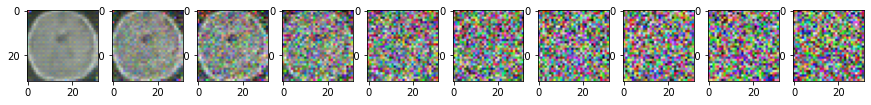

 32%|███▏      | 160/500 [14:48<33:06,  5.84s/it]

Epoch 160 | step 000 Loss: 0.09420271962881088 


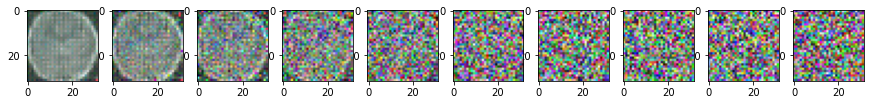

 33%|███▎      | 165/500 [15:18<32:19,  5.79s/it]

Epoch 165 | step 000 Loss: 0.12883643805980682 


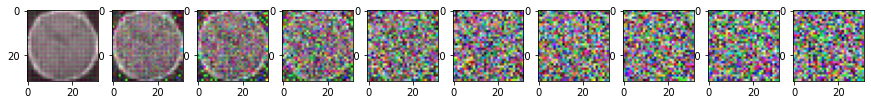

 34%|███▍      | 170/500 [15:46<30:25,  5.53s/it]

Epoch 170 | step 000 Loss: 0.16539651155471802 


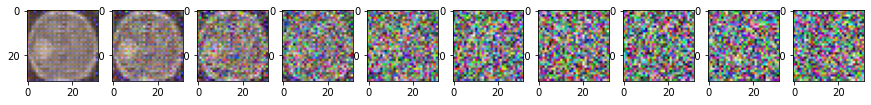

 35%|███▌      | 175/500 [16:13<28:55,  5.34s/it]

Epoch 175 | step 000 Loss: 0.08692166209220886 


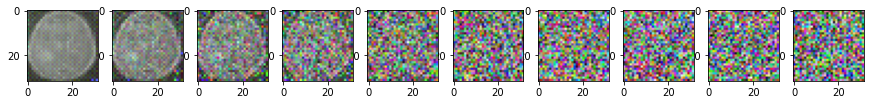

 36%|███▌      | 180/500 [16:40<28:25,  5.33s/it]

Epoch 180 | step 000 Loss: 0.09612594544887543 


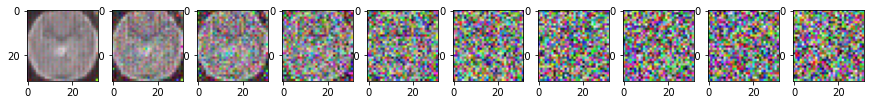

 37%|███▋      | 185/500 [17:07<27:47,  5.29s/it]

Epoch 185 | step 000 Loss: 0.11907432973384857 


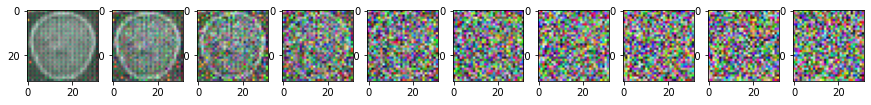

 38%|███▊      | 190/500 [17:34<27:34,  5.34s/it]

Epoch 190 | step 000 Loss: 0.10260091722011566 


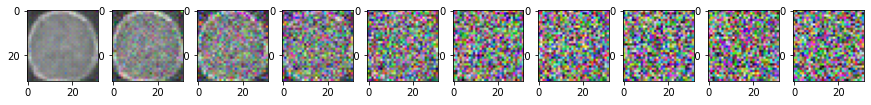

 39%|███▉      | 195/500 [18:01<27:02,  5.32s/it]

Epoch 195 | step 000 Loss: 0.08795686066150665 


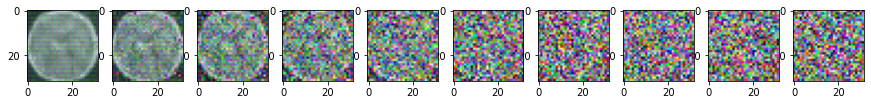

 40%|████      | 200/500 [18:29<26:57,  5.39s/it]

Epoch 200 | step 000 Loss: 0.09947788715362549 


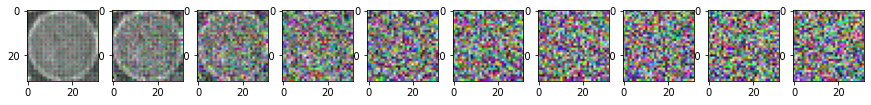

 41%|████      | 205/500 [18:56<26:14,  5.34s/it]

Epoch 205 | step 000 Loss: 0.0782514363527298 


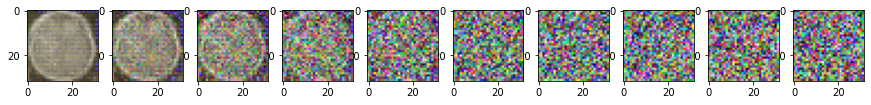

 42%|████▏     | 210/500 [19:23<25:38,  5.30s/it]

Epoch 210 | step 000 Loss: 0.1043776422739029 


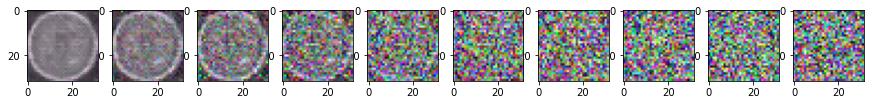

 43%|████▎     | 215/500 [19:50<25:15,  5.32s/it]

Epoch 215 | step 000 Loss: 0.12104817479848862 


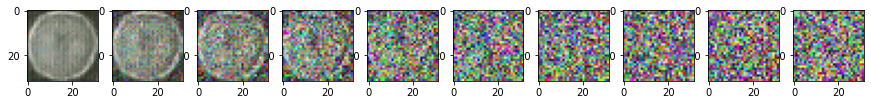

 44%|████▍     | 220/500 [20:17<24:51,  5.33s/it]

Epoch 220 | step 000 Loss: 0.11399446427822113 


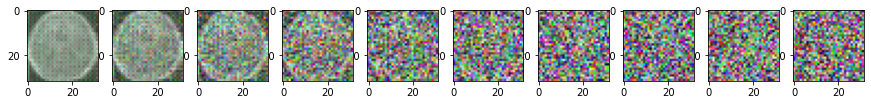

 45%|████▌     | 225/500 [20:44<24:28,  5.34s/it]

Epoch 225 | step 000 Loss: 0.10630687326192856 


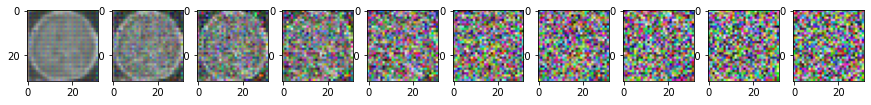

 46%|████▌     | 230/500 [21:11<23:49,  5.30s/it]

Epoch 230 | step 000 Loss: 0.1581551730632782 


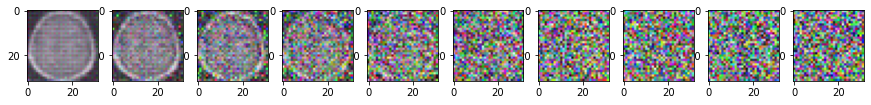

 47%|████▋     | 235/500 [21:38<23:23,  5.30s/it]

Epoch 235 | step 000 Loss: 0.14377550780773163 


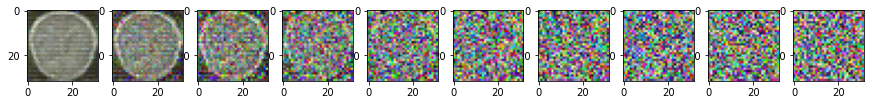

 48%|████▊     | 240/500 [22:05<23:01,  5.31s/it]

Epoch 240 | step 000 Loss: 0.08996253460645676 


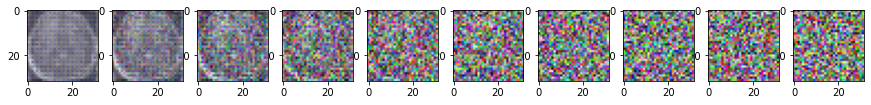

 49%|████▉     | 245/500 [22:32<22:30,  5.30s/it]

Epoch 245 | step 000 Loss: 0.08832699060440063 


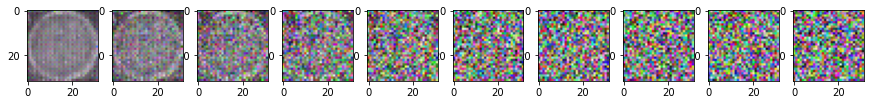

 50%|█████     | 250/500 [22:59<22:03,  5.30s/it]

Epoch 250 | step 000 Loss: 0.10551603883504868 


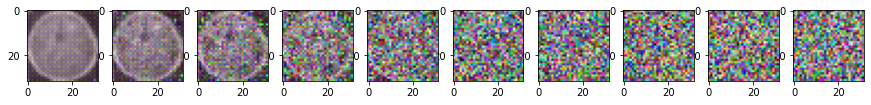

 51%|█████     | 255/500 [23:27<21:50,  5.35s/it]

Epoch 255 | step 000 Loss: 0.1187921091914177 


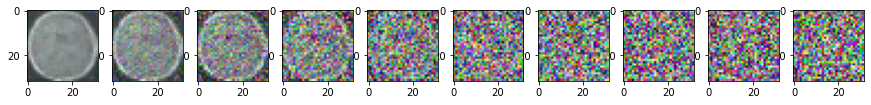

 52%|█████▏    | 260/500 [23:55<22:23,  5.60s/it]

Epoch 260 | step 000 Loss: 0.11381083726882935 


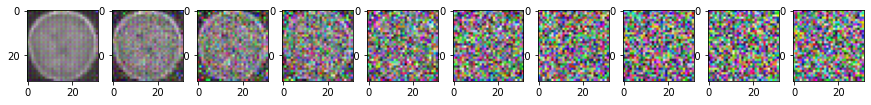

 53%|█████▎    | 265/500 [24:24<22:23,  5.72s/it]

Epoch 265 | step 000 Loss: 0.08796574920415878 


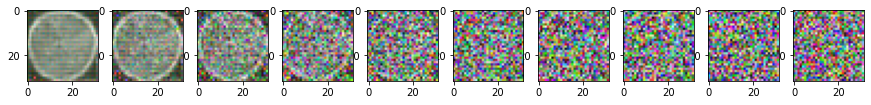

 54%|█████▍    | 270/500 [24:53<21:49,  5.69s/it]

Epoch 270 | step 000 Loss: 0.09422572702169418 


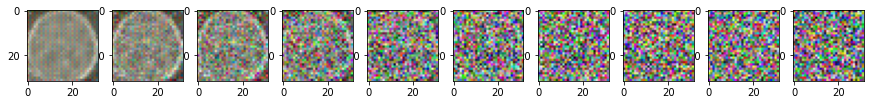

 55%|█████▌    | 275/500 [25:22<21:24,  5.71s/it]

Epoch 275 | step 000 Loss: 0.08423823118209839 


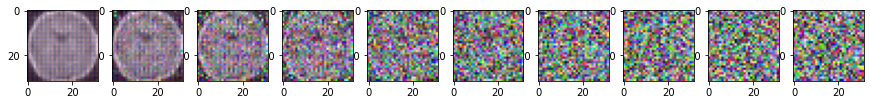

 56%|█████▌    | 280/500 [25:51<21:07,  5.76s/it]

Epoch 280 | step 000 Loss: 0.06815876066684723 


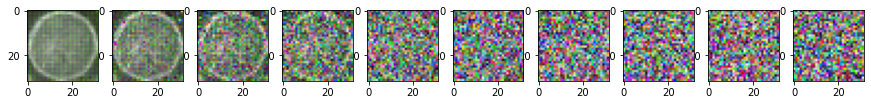

 57%|█████▋    | 285/500 [26:21<20:34,  5.74s/it]

Epoch 285 | step 000 Loss: 0.15390226244926453 


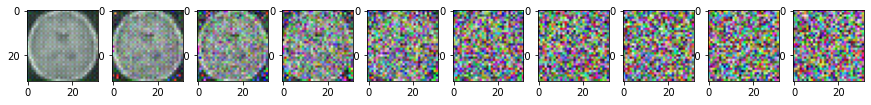

 58%|█████▊    | 290/500 [26:48<18:52,  5.39s/it]

Epoch 290 | step 000 Loss: 0.10410495847463608 


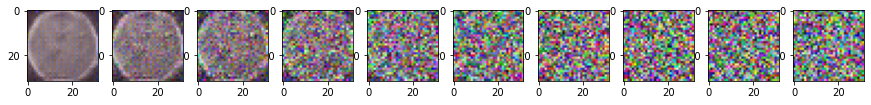

 59%|█████▉    | 295/500 [27:15<18:17,  5.35s/it]

Epoch 295 | step 000 Loss: 0.06344100832939148 


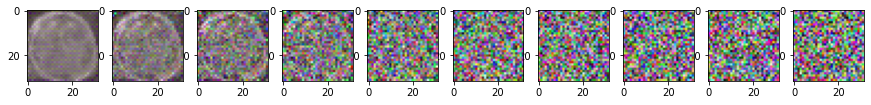

 60%|██████    | 300/500 [27:42<17:43,  5.32s/it]

Epoch 300 | step 000 Loss: 0.09484097361564636 


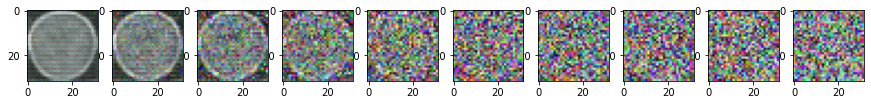

 61%|██████    | 305/500 [28:09<17:11,  5.29s/it]

Epoch 305 | step 000 Loss: 0.10005303472280502 


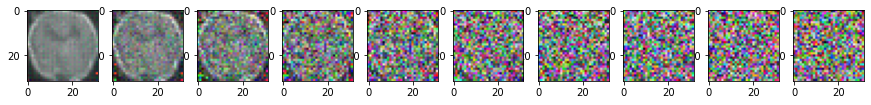

 62%|██████▏   | 310/500 [28:36<16:56,  5.35s/it]

Epoch 310 | step 000 Loss: 0.06656469404697418 


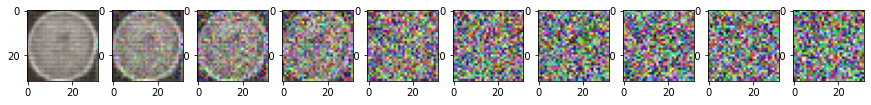

 63%|██████▎   | 315/500 [29:03<16:18,  5.29s/it]

Epoch 315 | step 000 Loss: 0.07867839187383652 


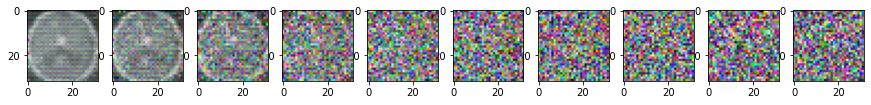

 64%|██████▍   | 320/500 [29:31<16:09,  5.39s/it]

Epoch 320 | step 000 Loss: 0.107004813849926 


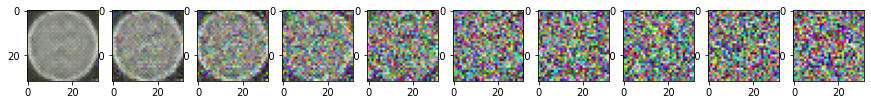

 65%|██████▌   | 325/500 [29:58<15:31,  5.32s/it]

Epoch 325 | step 000 Loss: 0.11018280684947968 


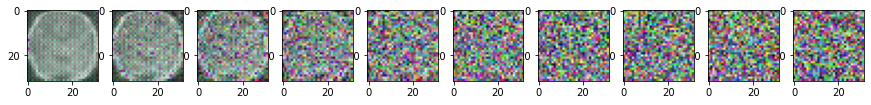

 66%|██████▌   | 330/500 [30:25<14:57,  5.28s/it]

Epoch 330 | step 000 Loss: 0.08805330097675323 


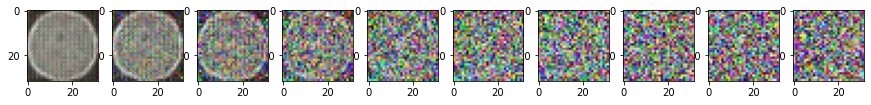

 67%|██████▋   | 335/500 [30:51<14:28,  5.26s/it]

Epoch 335 | step 000 Loss: 0.09359107911586761 


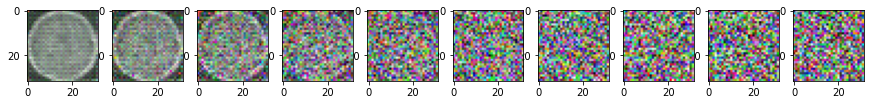

 68%|██████▊   | 340/500 [31:18<14:01,  5.26s/it]

Epoch 340 | step 000 Loss: 0.07039943337440491 


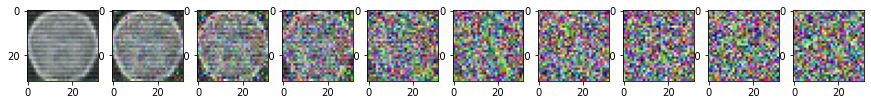

 69%|██████▉   | 345/500 [31:45<13:36,  5.27s/it]

Epoch 345 | step 000 Loss: 0.09052221477031708 


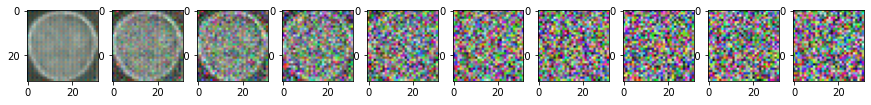

 70%|███████   | 350/500 [32:12<13:17,  5.31s/it]

Epoch 350 | step 000 Loss: 0.08152033388614655 


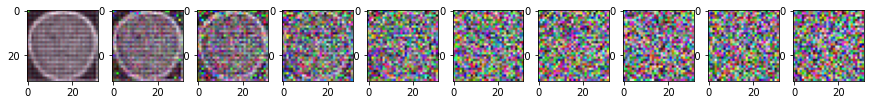

 71%|███████   | 355/500 [32:39<12:47,  5.30s/it]

Epoch 355 | step 000 Loss: 0.08896820992231369 


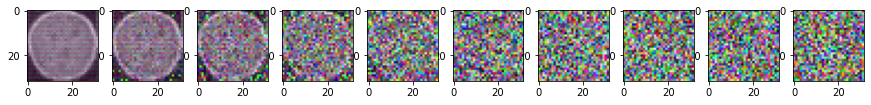

 72%|███████▏  | 360/500 [33:06<12:20,  5.29s/it]

Epoch 360 | step 000 Loss: 0.1116601824760437 


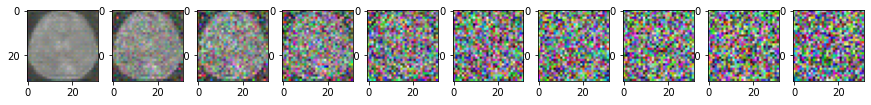

 73%|███████▎  | 365/500 [33:33<11:49,  5.26s/it]

Epoch 365 | step 000 Loss: 0.09030225872993469 


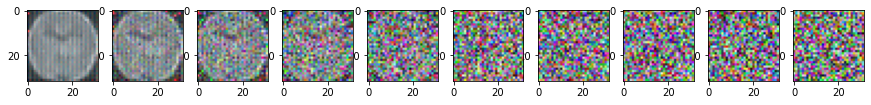

 74%|███████▍  | 370/500 [34:00<11:23,  5.26s/it]

Epoch 370 | step 000 Loss: 0.1111801490187645 


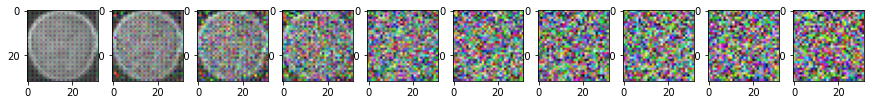

 75%|███████▌  | 375/500 [34:26<10:59,  5.27s/it]

Epoch 375 | step 000 Loss: 0.14762914180755615 


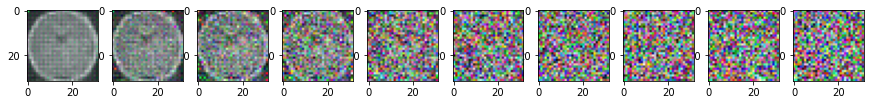

 76%|███████▌  | 380/500 [34:53<10:30,  5.25s/it]

Epoch 380 | step 000 Loss: 0.06744745373725891 


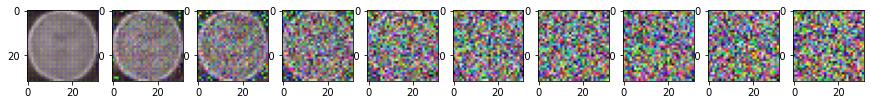

 77%|███████▋  | 385/500 [35:20<10:06,  5.27s/it]

Epoch 385 | step 000 Loss: 0.10405296087265015 


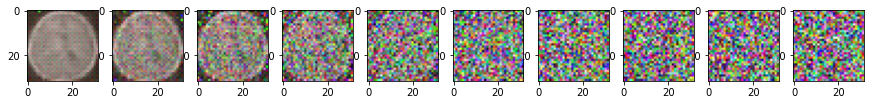

 78%|███████▊  | 390/500 [35:47<09:43,  5.30s/it]

Epoch 390 | step 000 Loss: 0.08093144744634628 


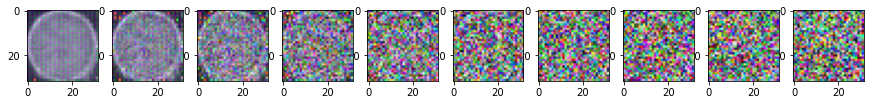

 79%|███████▉  | 395/500 [36:14<09:14,  5.28s/it]

Epoch 395 | step 000 Loss: 0.09885972738265991 


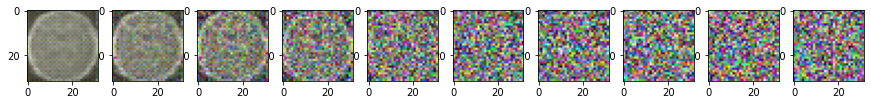

 80%|████████  | 400/500 [36:41<08:49,  5.29s/it]

Epoch 400 | step 000 Loss: 0.10222262144088745 


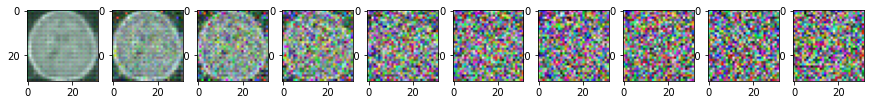

 81%|████████  | 405/500 [37:08<08:19,  5.26s/it]

Epoch 405 | step 000 Loss: 0.10713379085063934 


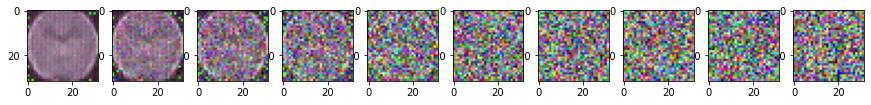

 82%|████████▏ | 410/500 [37:34<07:55,  5.28s/it]

Epoch 410 | step 000 Loss: 0.12614865601062775 


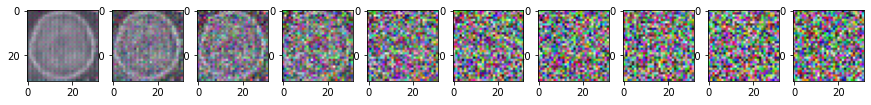

 83%|████████▎ | 415/500 [38:02<07:33,  5.33s/it]

Epoch 415 | step 000 Loss: 0.07395344972610474 


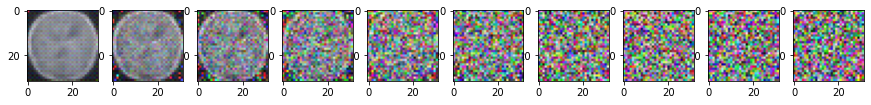

 84%|████████▍ | 420/500 [38:28<07:02,  5.28s/it]

Epoch 420 | step 000 Loss: 0.07461562752723694 


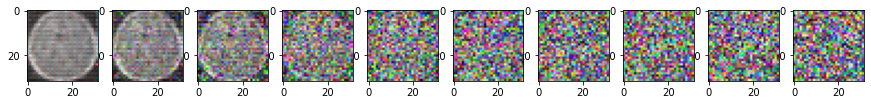

 85%|████████▌ | 425/500 [38:55<06:35,  5.27s/it]

Epoch 425 | step 000 Loss: 0.06286506354808807 


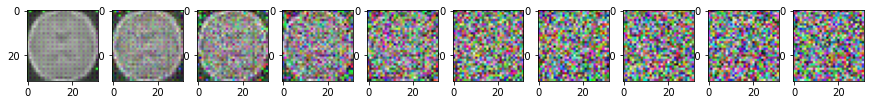

 86%|████████▌ | 430/500 [39:22<06:12,  5.32s/it]

Epoch 430 | step 000 Loss: 0.09689861536026001 


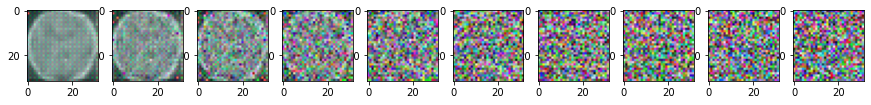

 87%|████████▋ | 435/500 [39:49<05:44,  5.30s/it]

Epoch 435 | step 000 Loss: 0.06603758782148361 


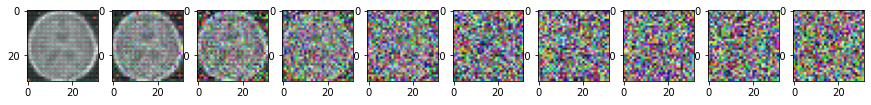

 88%|████████▊ | 440/500 [40:17<05:22,  5.37s/it]

Epoch 440 | step 000 Loss: 0.08432511985301971 


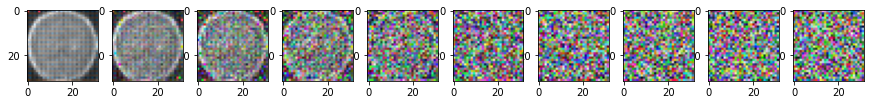

 89%|████████▉ | 445/500 [40:43<04:49,  5.27s/it]

Epoch 445 | step 000 Loss: 0.06581443548202515 


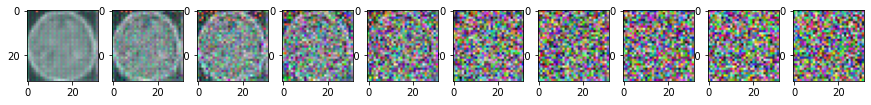

 90%|█████████ | 450/500 [41:10<04:24,  5.28s/it]

Epoch 450 | step 000 Loss: 0.09206295013427734 


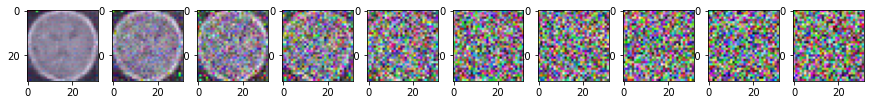

 91%|█████████ | 455/500 [41:37<03:57,  5.28s/it]

Epoch 455 | step 000 Loss: 0.11962473392486572 


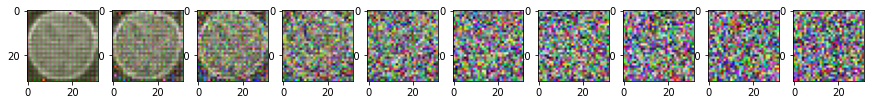

 92%|█████████▏| 460/500 [42:04<03:30,  5.26s/it]

Epoch 460 | step 000 Loss: 0.12667477130889893 


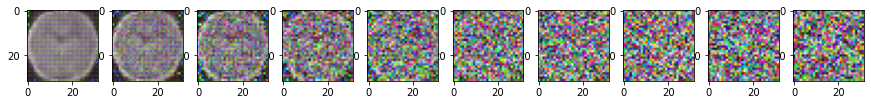

 93%|█████████▎| 465/500 [42:31<03:04,  5.27s/it]

Epoch 465 | step 000 Loss: 0.07242690026760101 


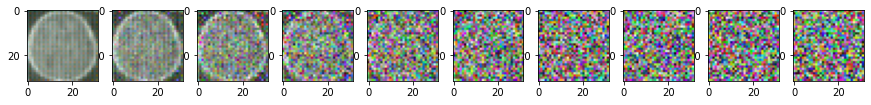

 94%|█████████▍| 470/500 [42:58<02:39,  5.33s/it]

Epoch 470 | step 000 Loss: 0.09086599946022034 


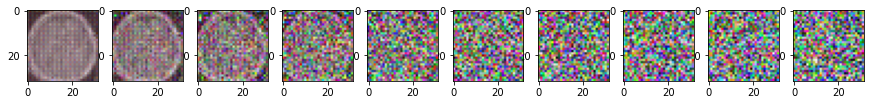

 95%|█████████▌| 475/500 [43:25<02:12,  5.29s/it]

Epoch 475 | step 000 Loss: 0.10651149600744247 


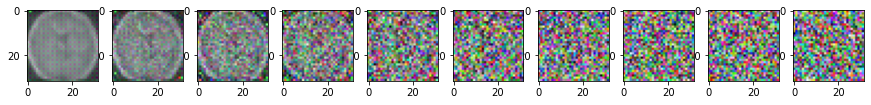

 96%|█████████▌| 480/500 [43:52<01:46,  5.32s/it]

Epoch 480 | step 000 Loss: 0.10737808793783188 


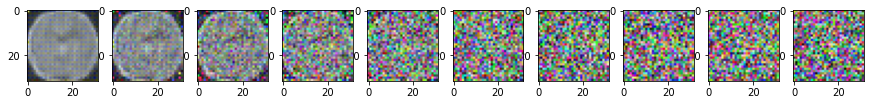

 97%|█████████▋| 485/500 [44:19<01:19,  5.28s/it]

Epoch 485 | step 000 Loss: 0.06832800805568695 


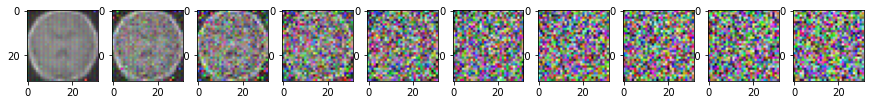

 98%|█████████▊| 490/500 [44:46<00:52,  5.27s/it]

Epoch 490 | step 000 Loss: 0.12862057983875275 


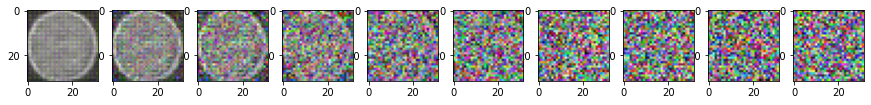

 99%|█████████▉| 495/500 [45:13<00:26,  5.27s/it]

Epoch 495 | step 000 Loss: 0.0916595384478569 


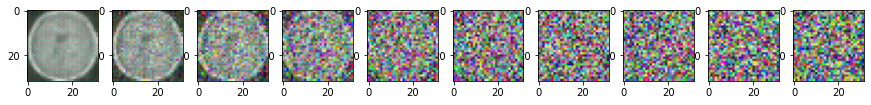

100%|██████████| 500/500 [45:39<00:00,  5.48s/it]


In [112]:

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 500 # Try more!

for epoch in tqdm(range(epochs)):
    for step, batch in enumerate(dataloader):
      optimizer.zero_grad()

      t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
      loss = get_loss(model, batch[0], t)
      loss.backward()
      optimizer.step()

      if epoch % 5 == 0 and step == 0:
        print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
        torch.save(model.state_dict(), f"model_log0/epoch: {epoch}")
        sample_plot_image()

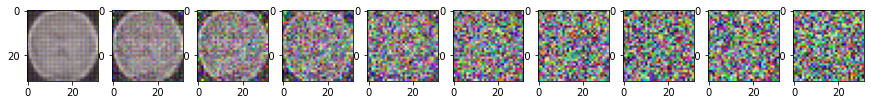

In [113]:
# torch.load(("model_log0/epoch: 75"))
sample_plot_image()

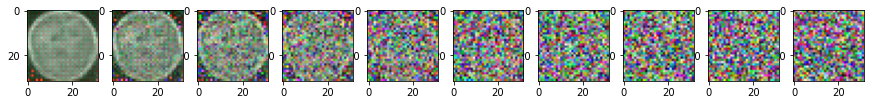

In [126]:
sample_plot_image()

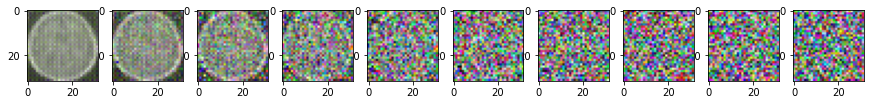

In [120]:
sample_plot_image()

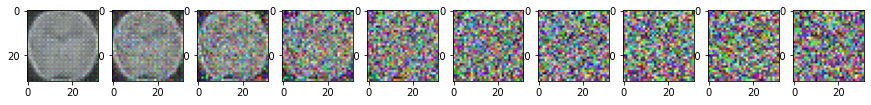

In [121]:
sample_plot_image()